In [3]:
import os

os.chdir('/ictstr01/home/icb/fatemehs.hashemig/codes/interpretable-ssl')

In [370]:
import importlib

import constants
import interpretable_ssl.configs.defaults

import interpretable_ssl.models.swav

import interpretable_ssl.trainers.base
import interpretable_ssl.trainers.trainer
import interpretable_ssl.trainers.scpoli_trainer
import interpretable_ssl.trainers.adaptive_trainer
import interpretable_ssl.trainers.swav

importlib.reload(interpretable_ssl.configs.defaults)
importlib.reload(constants)
importlib.reload(interpretable_ssl.models.swav)


importlib.reload(interpretable_ssl.trainers.base)
importlib.reload(interpretable_ssl.trainers.trainer)
importlib.reload(interpretable_ssl.trainers.scpoli_trainer)
importlib.reload(interpretable_ssl.trainers.adaptive_trainer)
importlib.reload(interpretable_ssl.trainers.swav)

<module 'interpretable_ssl.trainers.swav' from '/ictstr01/home/icb/fatemehs.hashemig/codes/interpretable-ssl/interpretable_ssl/trainers/swav.py'>

In [371]:
from interpretable_ssl.trainers.swav import *

t = SwAV(debug = True, experiment_name = "debug-swav4", training_type='pretrain', pretraining_epochs=11)

dataset is None, loading pbmc-immune
loading pbmc-immune data


INFO - 11/26/24 07:23:53 - 0:04:42 - Starting '__init__' of class 'get train test'
INFO - 11/26/24 07:23:53 - 0:04:42 - Finished '__init__' of class 'get train test' in 0.0159 seconds


done
------swav, pretraining epochs: 11, finetuning epochs: 500--------


In [ ]:
# load model at epoch e
# for a sample, print pt and ps and cross entropy
# map all samples to all prototypes, caluclate column sum + if hard clustering number of samples for each cluster

# load model at epoch e

In [15]:
import os
def get_checkpoint_path(self, epoch):
    return os.path.join(self.dump_path, f"ckp-{epoch}.pth") 

def load_epoch_model(self, e):
    model = self.get_model()
    # TODO
    checkpoint = torch.load(get_checkpoint_path(self, e))
    model.load_state_dict(checkpoint["state_dict"])
    model.to(self.device)
    return model

In [16]:
m2 = load_epoch_model(t, 2)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 



In [17]:
u = t.plot_umap(m2, t.ref.adata, 'ref', False)

100%|██████████| 57/57 [00:03<00:00, 16.49it/s]


# calculate pt and ps for one sample

In [196]:
t.batch_size = 600
t.nmb_crops = [2]
t.build_data()

INFO - 11/25/24 11:03:44 - 2:01:37 - Building data done with 29137 samples loaded.


In [19]:
t.setup()

INFO - 11/25/24 09:02:06 - 0:00:00 - ============ Initialized logger ============
INFO - 11/25/24 09:02:06 - 0:00:00 - all_latent: None
                                     augmentation_type: community
                                     base_lr: 4.8
                                     batch_size: 512
                                     cell_type_key: cell_type
                                     checkpoint_freq: 25
                                     condition_key: study
                                     crops_for_assign: [0, 1]
                                     cvae_epochs: 0
                                     cvae_loss_scaler: 0.0
                                     cvae_reg: 0
                                     dataset: pbmc-immune
                                     dataset_id: pbmc-immune
                                     debug: True
                                     decodable_prototypes: 0
                                     default_values: {'dataset_id':

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 



In [63]:
ld = self.prepare_scpoli_dataloader(
            self.ref.adata, self.get_scpoli(m2), shuffle=False
        )

In [64]:
batch = next(iter(ld))

In [65]:
batch['x'].shape

torch.Size([512, 4000])

In [197]:
train_batch = next(iter(self.train_loader))
train_batch['x'].shape

INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.
INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.
INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.
INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/25/24 11:03:54 - 2:01:48 - Starting to build community graph.
INFO - 11/25/24 11:03:54 - 2:01:48 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/25/24 11:04:16 - 2:02:10 - Performing Leiden community detection.
INFO - 11/25/24 11:04:16 - 2:02:10 - Performing Leiden community detection.
INFO - 11/25/24 11:04:16 - 2:02:10 - Performing Leiden community detection.
INFO - 11/25/24 11:04:16 - 2:02:10 - Performing Leiden community detection.
INFO - 11/25/24 11:04:18 - 2:02:12 - Performing Leiden community detection.
INFO - 11/25/24 11:04:18 - 2:02:12 - Performing Leiden community detection.
INFO - 11/25/24 11:04:19 - 2:02:13 - Performing Leiden community detection.
INFO - 11/25/24 11:04:19 - 2:02:13 - Performing Leiden community detection.
INFO - 11/25/24 11:04:19 - 2:02:13 - Performing Leiden community detection.
INFO - 11/25/24 11:04:20 - 2:02:14 - Performing Leiden community detection.
INFO - 11/25/24 11:04:20 - 2:02:14 - Community labels assigned to the cells.
INFO - 11/25/24 11:04:20 - 2:02:14 - Community labels assigned to the cells.
INFO - 11/25/24 11:04:22 - 2:02:16 - Community labels assigned to the cells.
INFO - 11

torch.Size([600, 2, 4000])

In [198]:
def get_key_sample_reshaped(batch, key, i, js):
    x = []
    for j in js:
        x.append(batch[key][i][j].reshape(1, -1))
    return torch.cat(x, dim=0)

def get_key_sample(batch, key, i, js):
    if key not in ['sizefactor', 'combined_batch']:
        return get_key_sample_reshaped(batch, key, i, js)
    x = []
    for j in js:
        x.append(batch[key][i][j])
    return torch.tensor(x)
    
def get_sample_ij(batch, i, js):
    return {key: get_key_sample(batch, key, i, js) for key in batch.keys()}
def get_sample(batch, i):
    return get_sample_ij(batch, i, [0, 1])

x = get_sample(train_batch, 0)
x['x'].shape, x['sizefactor'].shape

(torch.Size([2, 4000]), torch.Size([2]))

In [199]:
self = t
x = self.move_input_on_device(x)

In [200]:
batch = self.move_input_on_device(batch)

In [201]:
batch['sizefactor'].shape, x['sizefactor'].shape

(torch.Size([512]), torch.Size([2]))

In [202]:
z, _, s, _, _ = m2(x)

In [203]:
z.shape, s.shape

(torch.Size([2, 8]), torch.Size([2, 300]))

In [204]:
score_t, score_s = s[0], s[1]

In [222]:
def get_p(s):
    return F.softmax(s / self.temperature)
p_t = F.softmax(score_t / self.temperature)
p_s = F.softmax(score_s / self.temperature)

In [206]:
criterion = nn.CrossEntropyLoss()
criterion(p_t, p_s)

tensor(5.690, device='cuda:0', grad_fn=<DivBackward1>)

In [207]:
criterion(z[0], z[1])

tensor(-0.291, device='cuda:0', grad_fn=<DivBackward1>)

# based on the paper sudo code

In [208]:
q = self.distributed_sinkhorn(s)

In [209]:
q_t, q_s = q[0], q[1]

In [210]:
criterion(p_t, q_s) + criterion(p_s, q_t)

tensor(11.408, device='cuda:0', grad_fn=<AddBackward0>)

# using current trainer code

In [211]:
inputs = train_batch
inputs = self.move_input_on_device(inputs)
inputs = reshape_and_reorder_dict(inputs)

In [212]:
_, projector_out, scores, cvae_loss, prot_decoding_loss = m2(
                inputs
            )
self.compute_swav_loss(
                projector_out, scores, train_batch['x'].shape[0], False
            )

tensor(4.140, device='cuda:0', grad_fn=<DivBackward0>)

# check equipartition

In [213]:
bs = self.batch_size
s2_t, s2_s = scores[:bs], scores[bs:]

In [214]:
s2_t.shape

torch.Size([600, 300])

In [261]:
p2t = get_p(s2_t)
def print_range(x):
    return torch.sum(x, dim=0).min().item(),torch.sum(x, dim=0).mean().item(),torch.sum(x, dim=0).max().item() 
         
        
print_range(p2t)

(0.4446844458580017, 2.0, 3.4647216796875)

In [240]:
q2_t = self.distributed_sinkhorn(s2_t)

In [241]:
print_range(q2_t)

(tensor(1.045, device='cuda:0'),
 tensor(2., device='cuda:0'),
 tensor(3.551, device='cuda:0'))

In [242]:
def get_hard_cluster(tensor):
    # Find the indices of the maximum values along each row
    max_indices = torch.argmax(tensor, dim=1)
    
    # Create a one-hot tensor with the same shape as the input
    one_hot = torch.zeros_like(tensor)
    
    # Scatter 1s into the one-hot tensor at the max indices
    one_hot.scatter_(1, max_indices.unsqueeze(1), 1.0)
    return one_hot

In [243]:
hard_clusters = get_hard_cluster(s2_t)

In [244]:
print_range(hard_clusters)

(tensor(0., device='cuda:0'),
 tensor(2., device='cuda:0'),
 tensor(18., device='cuda:0'))

In [245]:
q = self.distributed_sinkhorn(hard_clusters)

In [249]:
hard_clusters1 = hard_clusters
hard_clusters2 = get_hard_cluster(s2_s)

In [251]:
clusters1 = torch.argmax(hard_clusters1, dim=1)
clusters2 = torch.argmax(hard_clusters2, dim=1)


In [252]:
clusters1[:5], clusters2[:5]

(tensor([103, 197, 113,   8, 113], device='cuda:0'),
 tensor([ 85, 158,  72, 189, 158], device='cuda:0'))

In [253]:
# Element-wise comparison
matches = clusters1 == clusters2

# Count the number of matched items
num_matches = matches.sum().item()
num_matches

65

In [256]:
matching_indices = torch.nonzero(matches, as_tuple=False).squeeze()

clusters1[matching_indices[:5]], clusters2[matching_indices[:5]]

(tensor([ 23, 292,  85, 241, 167], device='cuda:0'),
 tensor([ 23, 292,  85, 241, 167], device='cuda:0'))

# turn into function

In [ ]:
# write a function, 
# print number of match samples and min, mean and max of number of samples in each prototypes (or maybe plot distribution in next step

In [331]:
import logging
import warnings

def suppress_logs_and_warnings(func):
    def wrapper(*args, **kwargs):
        logging.disable(logging.CRITICAL)  # Disable all logs
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")  # Suppress all warnings
            result = func(*args, **kwargs)
        logging.disable(logging.NOTSET)  # Re-enable logging
        return result
    return wrapper
    
def print_pair_range(pair, name):
    t, s = pair
    print(f'{name}_t range: ', print_range(t))
    print(f'{name}_s range: ', print_range(s))

@suppress_logs_and_warnings
def evaluate_epoch_return_p(t, e, default_bs = 512, default_nmb_crop = [8]):
    t.batch_size = default_bs
    t.nmb_crops = default_nmb_crop
    model = load_epoch_model(t, e)
    # u = t.plot_umap(model, t.ref.adata, 'ref', False)
    print('setup trainer and data loader')
    t.setup()
    t.nmb_crops = [2]
    t.batch_size = 600
    t.build_data()
    self = t
    train_batch = next(iter(self.train_loader))

    inputs = train_batch
    inputs = self.move_input_on_device(inputs)
    inputs = reshape_and_reorder_dict(inputs)
    _, projector_out, scores, cvae_loss, prot_decoding_loss = model(
                inputs
            )
    loss = self.compute_swav_loss(
                projector_out, scores, train_batch['x'].shape[0], False
            )
    print(f'swav loss: {loss}')
    score_t, score_s = scores[:t.batch_size], scores[t.batch_size:]
    p_t, p_s = get_p(score_t), get_p(score_s)
    print_pair_range((p_t, p_s), 'p')
    q_t = self.distributed_sinkhorn(p_t)
    q_s = self.distributed_sinkhorn(p_s)
    print_pair_range((q_t, q_s), 'q')
    
    h_t, h_s = get_hard_cluster(score_t), get_hard_cluster(score_s)
    print_pair_range((h_t, h_s), 'hard clusters')
    
    c_t, c_s = torch.argmax(h_t, dim=1), torch.argmax(h_s, dim=1)
    matches = c_t == c_s
    num_matches = matches.sum().item()
    print(f'number of matched samples: {num_matches}, ratio: {num_matches/ len(c_t)}')
    
    return model, (p_t, p_s), (q_t, q_s) 
def evaluate_epoch(t, e):
    model, _, _ = evaluate_epoch_return_p(t, e)

# check results

In [326]:
m0 = evaluate_epoch(t, 0)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

setup trainer and data loader
Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
      

In [327]:
m2 = evaluate_epoch(t, 2)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

setup trainer and data loader
Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
      

In [328]:
m4 = evaluate_epoch(t, 4)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

setup trainer and data loader
Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
      

In [329]:
m8 = evaluate_epoch(t, 8)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

setup trainer and data loader
Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
      

In [330]:
m10 = evaluate_epoch(t, 10)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

setup trainer and data loader
Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
      

In [297]:
u = t.plot_umap(m2, t.ref.adata, 'ref', False)

100%|██████████| 49/49 [00:01<00:00, 26.05it/s]


In [ ]:
u = t.plot_umap(m4, t.ref.adata, 'ref', False)

In [ ]:
u = t.plot_umap(m8, t.ref.adata, 'ref', False)

In [ ]:
u = t.plot_umap(m10, t.ref.adata, 'ref', False)

# plot p distribution of 8 and 10

In [332]:
m8, p8, q8 = evaluate_epoch_return_p(t, 8)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

setup trainer and data loader
Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
      

In [342]:
m10, p10, q10 = evaluate_epoch_return_p(t, 10)

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

setup trainer and data loader
Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 

         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
      

In [343]:
p_t8, p_s8 = p8
p_t10, p_s10 = p10

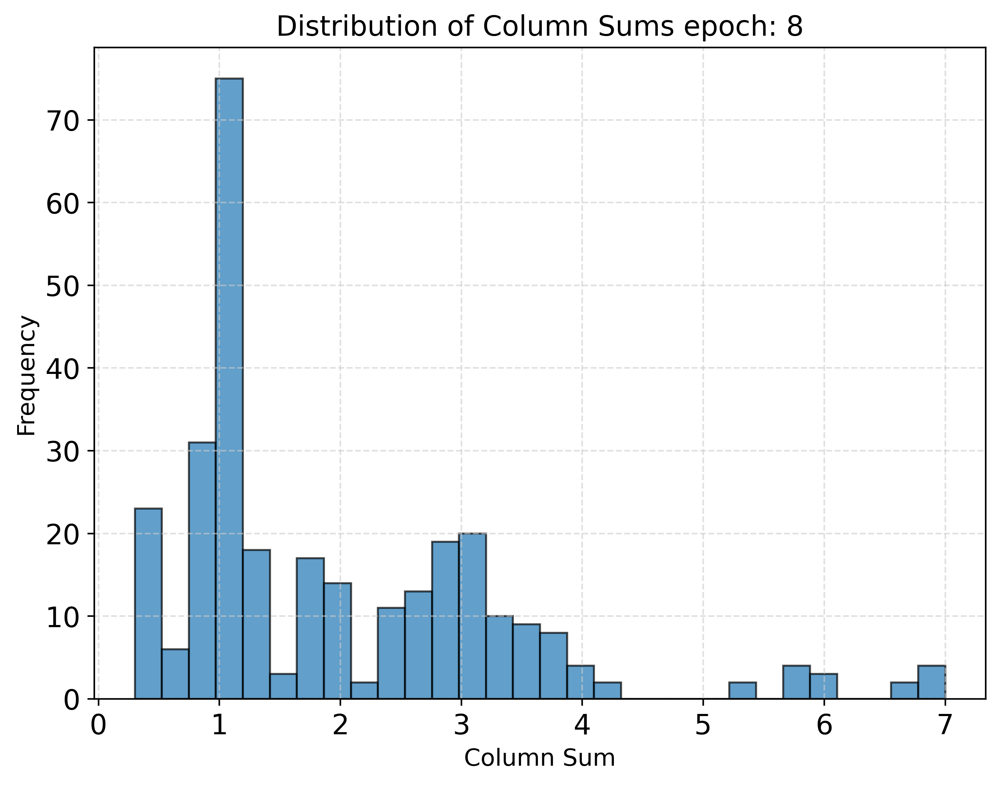

In [341]:
import torch
import matplotlib.pyplot as plt

def plot_column_sum_distribution(tensor, e):
    """
    Calculate the sum of each column in the given tensor and plot its distribution.
    
    Parameters:
        tensor (torch.Tensor): A 2D tensor where the sum of each column is computed.
    """
    # Ensure the tensor is 2D
    if tensor.ndimension() != 2:
        raise ValueError("Input tensor must be 2D.")

    # Calculate the sum of each column
    column_sums = tensor.sum(dim=0).cpu().detach().numpy()

    # Plot the distribution
    plt.figure(figsize=(8, 6))
    plt.hist(column_sums, bins=30, edgecolor='black', alpha=0.7)
    plt.title(f'Distribution of Column Sums epoch: {e}', fontsize=14)
    plt.xlabel('Column Sum', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()
plot_column_sum_distribution(p_t, 8)

In [344]:
def plot_column_sum_distributions(tensor1, tensor2, label1, label2):
    """
    Calculate the sum of each column for two tensors and plot their distributions in one figure.
    
    Parameters:
        tensor1 (torch.Tensor): First 2D tensor.
        tensor2 (torch.Tensor): Second 2D tensor.
        label1 (str): Label for the first tensor's distribution.
        label2 (str): Label for the second tensor's distribution.
    """
    # Ensure both tensors are 2D
    if tensor1.ndimension() != 2 or tensor2.ndimension() != 2:
        raise ValueError("Both tensors must be 2D.")
    
    # Calculate the sum of each column for both tensors
    column_sums1 = tensor1.sum(dim=0).cpu().detach().numpy()
    column_sums2 = tensor2.sum(dim=0).cpu().detach().numpy()

    # Plot the distributions
    plt.figure(figsize=(10, 6))
    plt.hist(column_sums1, bins=30, alpha=0.6, label=label1, edgecolor='black')
    plt.hist(column_sums2, bins=30, alpha=0.6, label=label2, edgecolor='black')
    plt.title('Comparison of Column Sum Distributions', fontsize=14)
    plt.xlabel('Column Sum', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

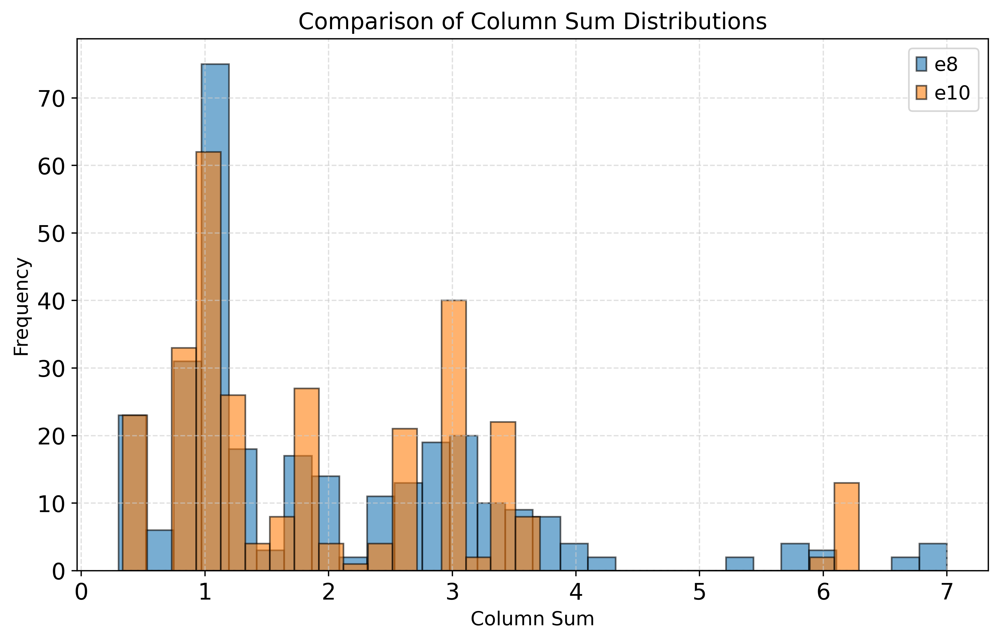

In [345]:
plot_column_sum_distributions(p_t8, p_t10, 'e8', 'e10')

In [346]:
pn8 = p_t8.sum(0)
pn8.shape

torch.Size([300])

In [347]:
pn10 = p_t10.sum(0)

In [348]:
def calculate_entropy(tensor):
    """
    Calculate the entropy of a tensor.

    Parameters:
        tensor (torch.Tensor): Input tensor.

    Returns:
        float: Entropy of the tensor.
    """
    # Flatten the tensor and convert to probabilities
    flattened = tensor.flatten()
    probabilities = flattened / flattened.sum()

    # Ensure no zero values (to avoid log(0))
    probabilities = probabilities[probabilities > 0]

    # Compute entropy
    entropy = -torch.sum(probabilities * torch.log(probabilities))
    return entropy.item()

In [349]:
calculate_entropy(pn8)

5.484107494354248

In [350]:
calculate_entropy(pn10)

5.490940093994141

In [351]:
q_t, q_s = q8
qn8 = q_t.sum(0)
qn8.shape

torch.Size([300])

In [352]:
calculate_entropy(qn8)

5.69407844543457

In [358]:
pn8.sum()

tensor(600., device='cuda:0', grad_fn=<SumBackward0>)

In [357]:
qn8.sum()

tensor(600., device='cuda:0')

# test new trainer metric function

In [372]:
t.setup()
self = t
inputs = next(iter(self.train_loader))
bs = inputs["x"].size(0)
model = load_epoch_model(t, 2)
inputs = self.move_input_on_device(inputs)
inputs = reshape_and_reorder_dict(inputs)
_, projector_out, scores, cvae_loss, prot_decoding_loss = model(
    inputs
)

INFO - 11/26/24 07:24:39 - 0:00:00 - ============ Initialized logger ============
INFO - 11/26/24 07:24:39 - 0:00:00 - all_latent: None
                                     augmentation_type: community
                                     base_lr: 4.8
                                     batch_size: 512
                                     cell_type_key: cell_type
                                     checkpoint_freq: 25
                                     condition_key: study
                                     crops_for_assign: [0, 1]
                                     cvae_epochs: 0
                                     cvae_loss_scaler: 0.0
                                     cvae_reg: 0
                                     dataset: pbmc-immune
                                     dataset_id: pbmc-immune
                                     debug: True
                                     decodable_prototypes: 0
                                     default_values: {'dataset_id':

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 



INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.
INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.
INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.
INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.
INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.
INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/26/24 07:24:39 - 0:00:01 - Starting to build community graph.
INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.
INFO - 11/26/24 07:24:39 - 0:00:01 - Running Scanpy neighbors with k=11.


         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.
         Falling back to preprocessing with `sc.pp.pca` and default params.


INFO - 11/26/24 07:25:00 - 0:00:21 - Performing Leiden community detection.
INFO - 11/26/24 07:25:00 - 0:00:21 - Performing Leiden community detection.
INFO - 11/26/24 07:25:00 - 0:00:21 - Performing Leiden community detection.
INFO - 11/26/24 07:25:00 - 0:00:22 - Performing Leiden community detection.
INFO - 11/26/24 07:25:00 - 0:00:22 - Performing Leiden community detection.
INFO - 11/26/24 07:25:00 - 0:00:22 - Performing Leiden community detection.
INFO - 11/26/24 07:25:01 - 0:00:22 - Performing Leiden community detection.
INFO - 11/26/24 07:25:01 - 0:00:22 - Performing Leiden community detection.
INFO - 11/26/24 07:25:01 - 0:00:22 - Performing Leiden community detection.
INFO - 11/26/24 07:25:01 - 0:00:22 - Performing Leiden community detection.
INFO - 11/26/24 07:25:07 - 0:00:28 - Community labels assigned to the cells.
INFO - 11/26/24 07:25:07 - 0:00:28 - Community labels assigned to the cells.
INFO - 11/26/24 07:25:07 - 0:00:28 - Community labels assigned to the cells.
INFO - 11

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 



In [373]:
t.calculate_pair_matching(scores)

(38, 5.634565353393555)

In [376]:
tensor = torch.full((300,), 1)

In [377]:
calculate_entropy(tensor)

5.703782474656201